In [1]:
import sys
import matplotlib.pyplot as plt
import numpy as np    

%matplotlib inline
import pandas as pd
from scipy.optimize import curve_fit
from scipy.stats import chisquare
import scipy.stats as stats
from itertools import combinations
import math
import os
import time


from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
myhost = os.uname()[1]
if myhost == 'macmazzitelli.lnf.infn.it':
    mybasepath = '/Users/mazzitel/Dropbox/GR2/soft/data/'
    sys.path.append('../lib')
    posix=False
else:
    mybasepath = '/workarea/cloud-storage/mazzitel/'
    posix=True
print("Host:", myhost)
print (sys.version, get_ipython())
if 'google.colab' in str(get_ipython()) and sys.version[0:1] in '3':
    mybasepath = './'
    posix=False
    print('Running on CoLab')
    !wget https://raw.githubusercontent.com/gmazzitelli/cygno_cloud/main/cygnus_lib.py
    !wget https://raw.githubusercontent.com/gmazzitelli/cygno/master/mylib.py
    !madir out
    !mkdir ped
    # credits https://gist.github.com/MohamedElashri/
    !wget https://s3.cloud.infn.it/v1/AUTH_2ebf769785574195bde2ff418deac08a/cygnus/Analysis/root.tar.gz
    !gunzip root.tar.gz
    !tar -xf  root.tar
    !apt-get install git dpkg-dev cmake g++ gcc binutils libx11-dev libxpm-dev libxft-dev libxext-dev tar gfortran subversion
    !install root_numpy
    
    import sys
    sys.path.append("/content/root_build/")
    sys.path.append("/content/root_build/bin/")
    sys.path.append("/content/root_build/include/")
    sys.path.append("/content/root_build/lib/")
    import ctypes
    libfile = !ls /content/root_build/lib/*.so*
    for i, lib in enumerate(libfile):
        if not (lib=='/content/root_build/lib/libtbbmalloc_proxy.so' or lib=='/content/root_build/lib/libtbbmalloc.so' or lib=='/content/root_build/lib/libtbb.so'): 
            ctypes.cdll.LoadLibrary(lib)
    !pip install root-numpy

import cygnus_lib as cy
import mylib as my
import ROOT
import root_numpy as rtnp

Host: f07f81f67a26
3.6.8 (default, Nov 16 2020, 16:55:22) 
[GCC 4.8.5 20150623 (Red Hat 4.8.5-44)] <ipykernel.zmqshell.ZMQInteractiveShell object at 0x7f89aec64668>
Welcome to JupyROOT 6.22/06


rascale:  4
/workarea/cloud-storage/mazzitel/ped/run4034_mean.h5 /workarea/cloud-storage/mazzitel/ped/run4034_sigma.h5
light over Th: 15912042.90 
Open file: /workarea/cloud-storage/cygnus/Data/LAB/histograms_Run04035.root
Find Keys: 100
# of Images (TH2) Files: 100 
# of Waveform (TH2) Files: 0 
Camera X, Y pixel: 2304 2304 
Processing RUN:  4035 Event:  0
(array([288.67759491, 299.95850749]), array([ 0.97262564, -0.23237763]))
(array([294.03794038, 248.35230352]), array([ 0.83167782, -0.55525849]))
ph 1678, dim: 369
x,y start: 1692, 124, x,y stop: 320, 2180, length: 2472: 
Mean squared error: 0.44
Coefficient of determination: 1.00


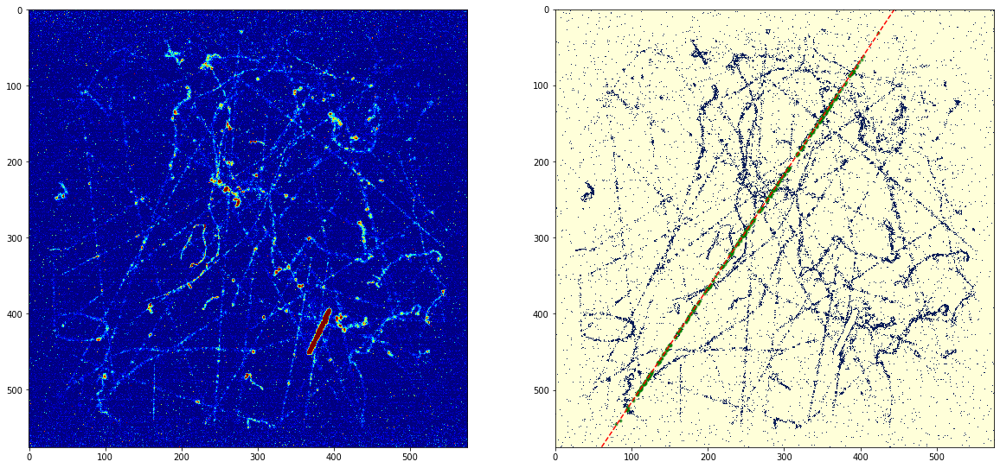

(array([309.15160129, 282.73735077]), array([-0.2284052 ,  0.97356616]))
(array([341.50611247, 382.17359413]), array([0.64921577, 0.76060429]))
ph 2052, dim: 409
x,y start: 76, 128, x,y stop: 2288, 2012, length: 2906: 
Mean squared error: 0.71
Coefficient of determination: 1.00


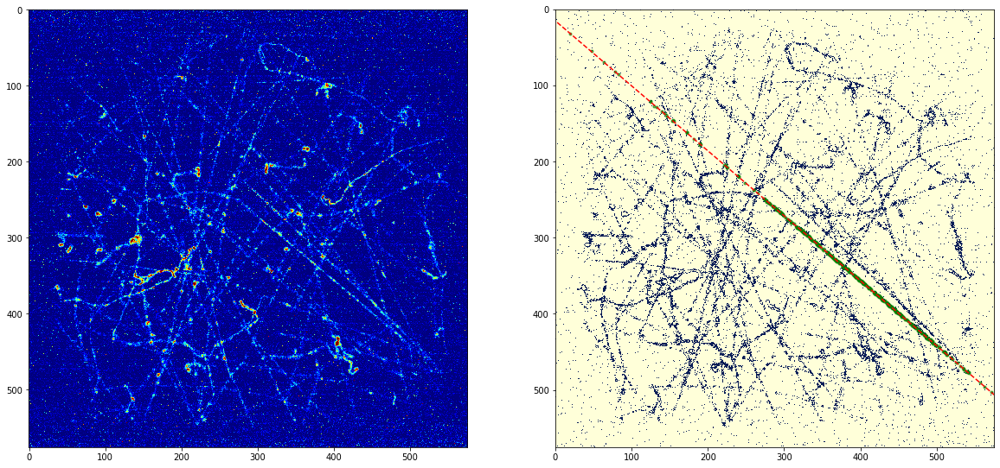

(array([284.83257799, 278.28758745]), array([-0.64836778,  0.76132728]))
(array([299.8502994 , 409.64670659]), array([0.8404072 , 0.54195548]))
ph 1434, dim: 334
x,y start: 1020, 236, x,y stop: 2184, 2048, length: 2154: 
Mean squared error: 0.47
Coefficient of determination: 1.00


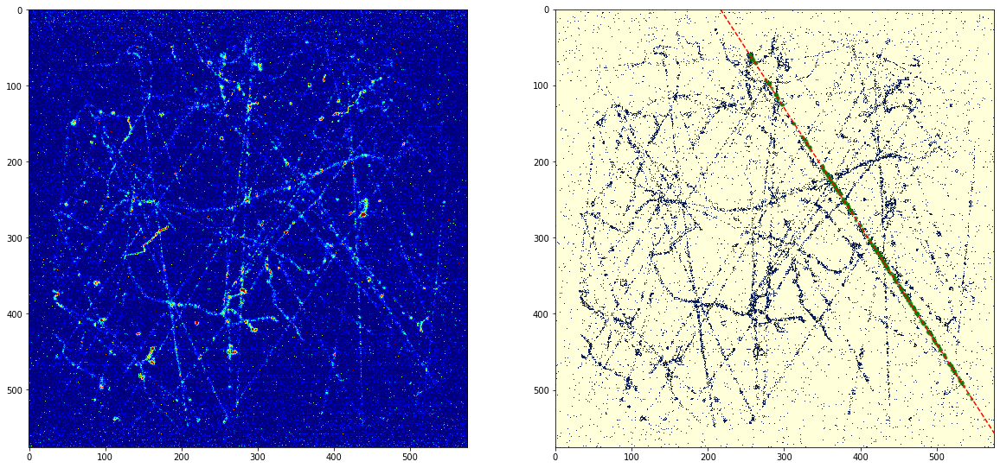

(array([307.30325526, 289.65070403]), array([0.96514617, 0.26171144]))
(array([252.09852217, 310.19704433]), array([0.68085768, 0.73241574]))
ph 1950, dim: 406
x,y start: 340, 176, x,y stop: 2108, 1816, length: 2412: 
Mean squared error: 0.61
Coefficient of determination: 1.00


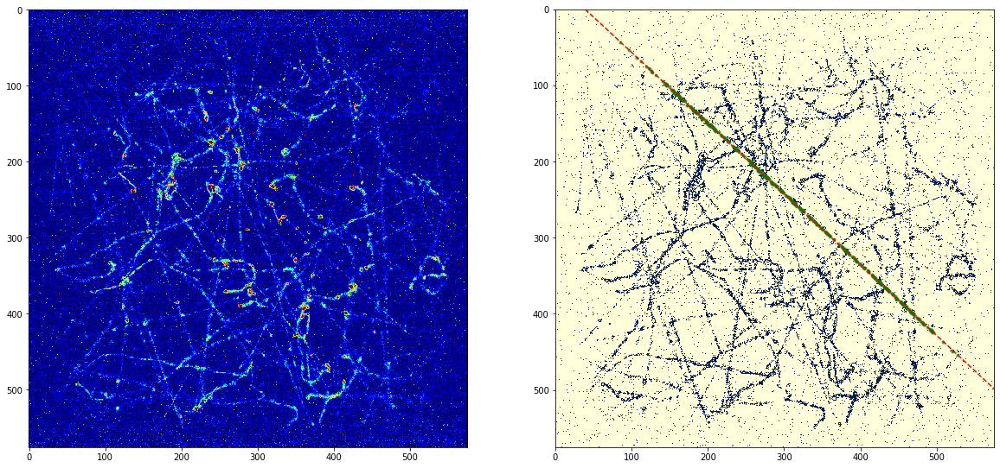

(array([290.83575492, 282.98119497]), array([0.6635056 , 0.74817132]))
(array([303.33031674, 340.12443439]), array([0.9343541 , 0.35634593]))
ph 2132, dim: 442
x,y start: 916, 40, x,y stop: 1768, 2272, length: 2389: 
Mean squared error: 0.36
Coefficient of determination: 1.00


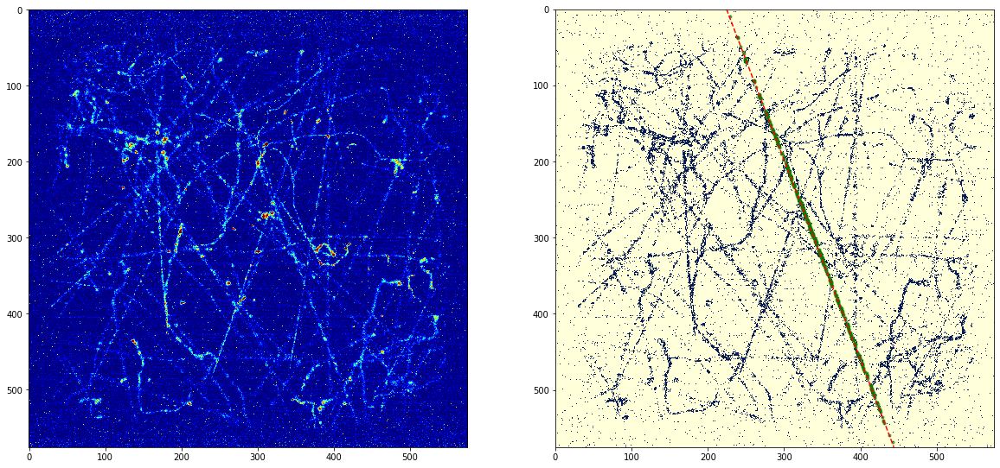

(array([296.60473555, 271.61063666]), array([-0.60171858,  0.79870818]))
(array([395.65526316, 253.28421053]), array([ 0.56860241, -0.82261249]))
ph 1759, dim: 380
x,y start: 2224, 744, x,y stop: 200, 2148, length: 2463: 
Mean squared error: 1.03
Coefficient of determination: 1.00


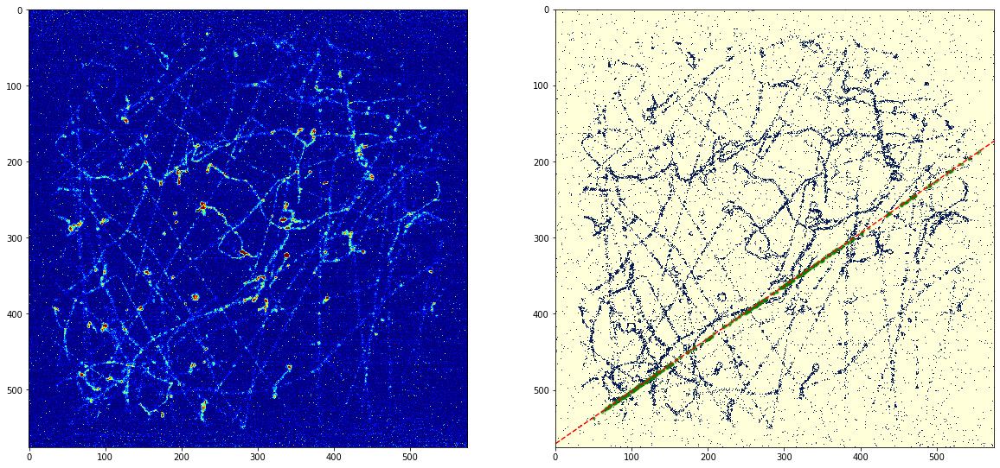

(array([291.12390473, 281.40536427]), array([ 0.99778183, -0.06656891]))
(array([300.02325581, 199.23546512]), array([ 0.98900346, -0.14789235]))
ph 1534, dim: 344
x,y start: 964, 76, x,y stop: 652, 2172, length: 2119: 
Mean squared error: 0.32
Coefficient of determination: 1.00


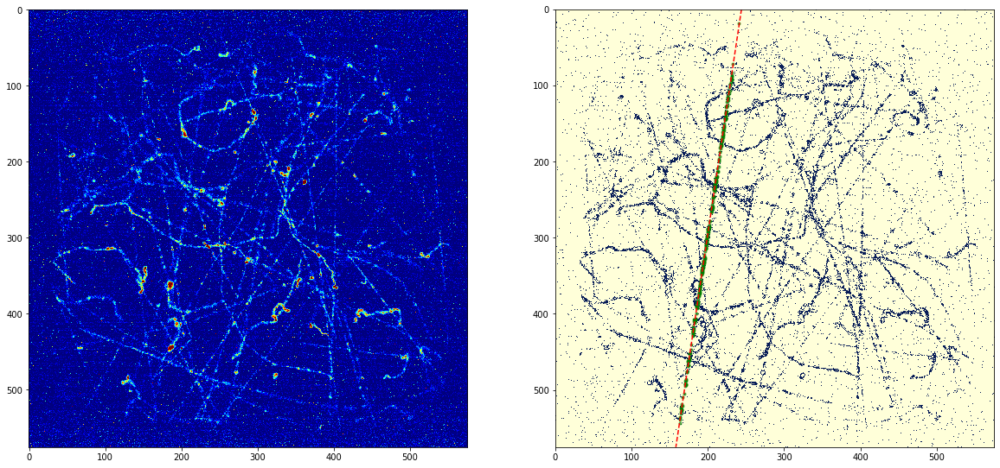

(array([325.10523158, 277.11927046]), array([ 0.29766898, -0.95466915]))
(array([275.09383378, 231.50402145]), array([0.94844618, 0.31693824]))
ph 1713, dim: 373
x,y start: 596, 104, x,y stop: 1264, 2108, length: 2112: 
Mean squared error: 0.38
Coefficient of determination: 1.00


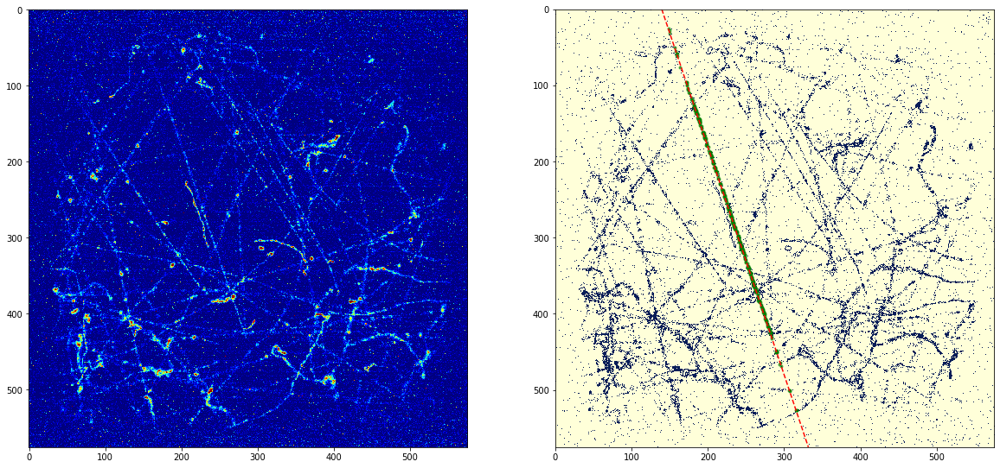

(array([312.02108557, 301.58123161]), array([ 0.69895091, -0.71516964]))
(array([282.18936877, 211.94684385]), array([0.99931279, 0.03706675]))
ph 1465, dim: 301
x,y start: 808, 52, x,y stop: 888, 2164, length: 2114: 
Mean squared error: 0.30
Coefficient of determination: 0.98


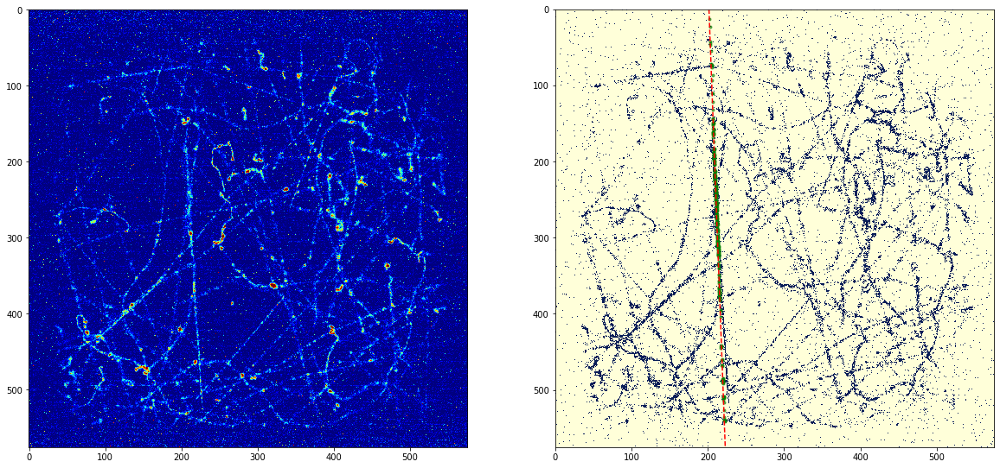

(array([278.67215139, 284.92873488]), array([0.10198585, 0.99478585]))
(array([304.6773399 , 201.08374384]), array([0.95349633, 0.30140462]))
ph 1874, dim: 406
x,y start: 424, 12, x,y stop: 1112, 2188, length: 2282: 
Mean squared error: 0.36
Coefficient of determination: 1.00


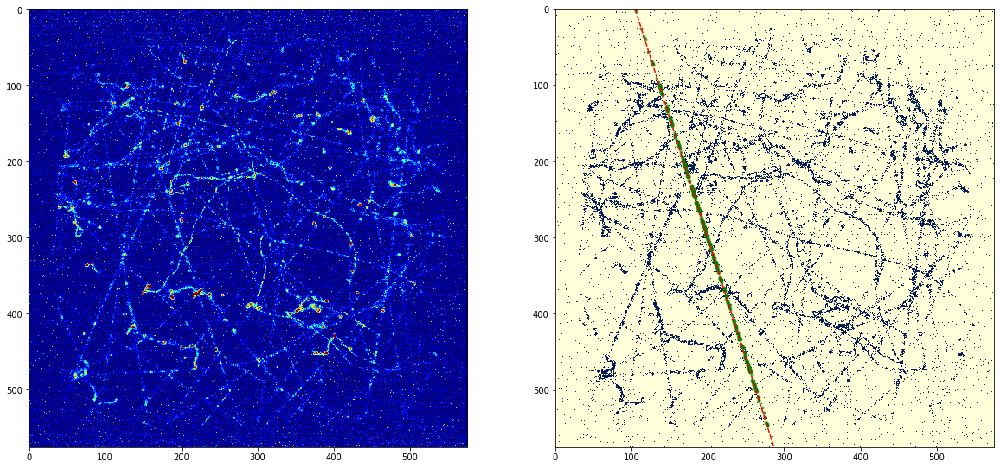

Processing RUN:  4035 Event:  10
(array([292.55503919, 305.67053939]), array([-0.66154954,  0.74990147]))
(array([263.34753363, 246.38565022]), array([ 0.65115399, -0.75894564]))
ph 2118, dim: 446
x,y start: 2184, 24, x,y stop: 52, 1860, length: 2814: 
Mean squared error: 0.75
Coefficient of determination: 1.00


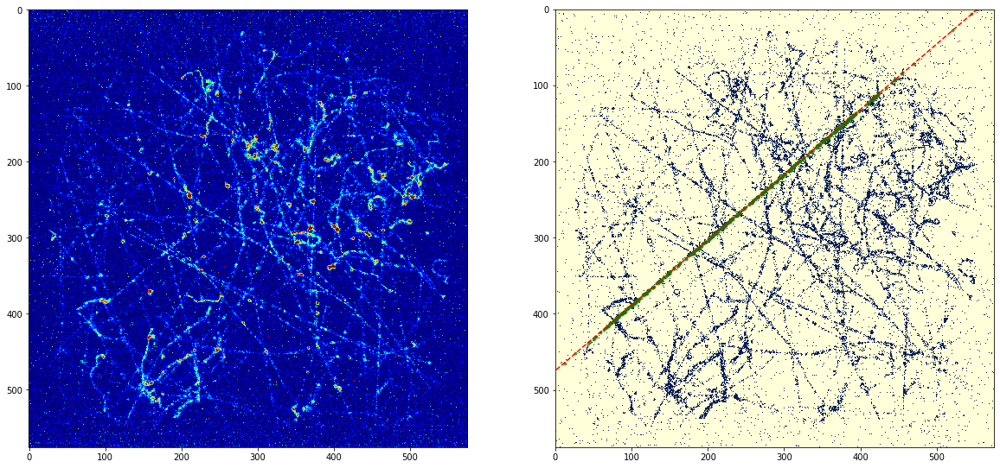

(array([295.5787865 , 265.04028285]), array([ 0.70766079, -0.70655234]))
(array([285.19277108, 186.95481928]), array([ 0.82275538, -0.56839562]))
ph 1569, dim: 332
x,y start: 1424, 164, x,y stop: 60, 2144, length: 2404: 
Mean squared error: 0.48
Coefficient of determination: 1.00


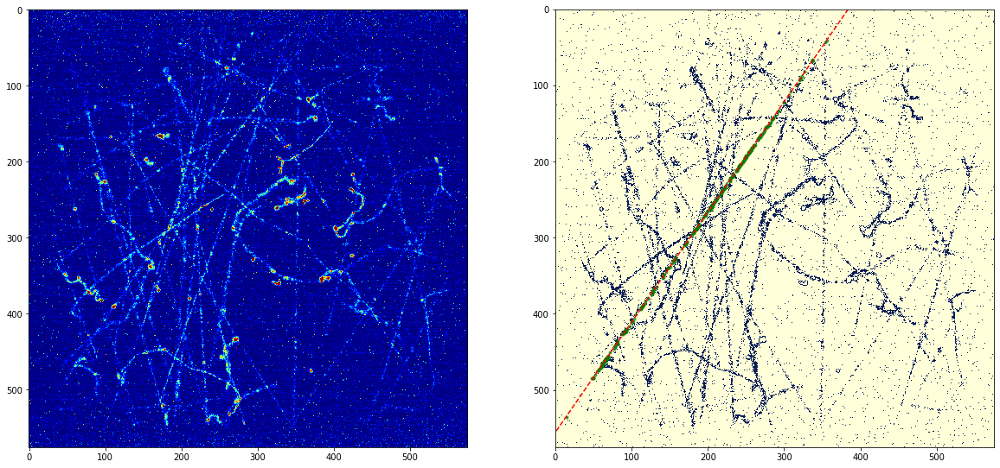

(array([289.09956306, 276.48257833]), array([-0.18092478,  0.98349694]))
(array([267.23529412, 229.53921569]), array([ 0.81537685, -0.57893055]))
ph 1229, dim: 306
x,y start: 1648, 36, x,y stop: 68, 2264, length: 2731: 
Mean squared error: 0.45
Coefficient of determination: 1.00


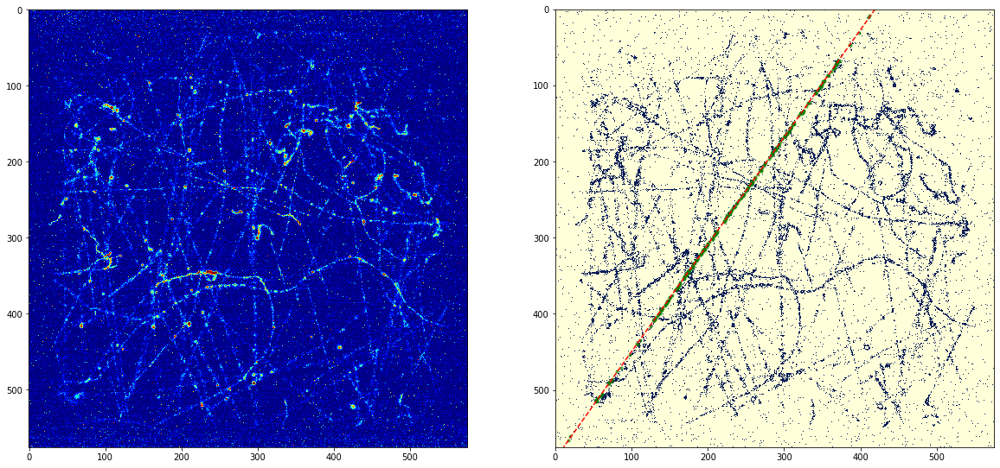

(array([308.64507643, 279.49322322]), array([0.06066551, 0.99815815]))
(array([306.16396761, 432.51619433]), array([0.97442201, 0.22472592]))
ph 2576, dim: 494
x,y start: 1464, 84, x,y stop: 1944, 2160, length: 2131: 
Mean squared error: 0.35
Coefficient of determination: 1.00


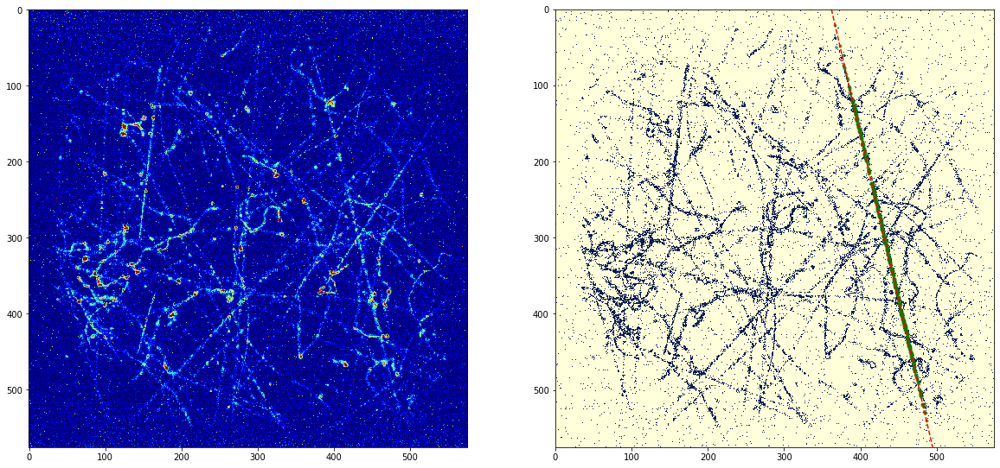

(array([319.18632627, 307.09727391]), array([0.14736556, 0.9890821 ]))
(array([315.19346734, 306.55778894]), array([0.63758795, 0.77037757]))
ph 1893, dim: 398
x,y start: 32, 268, x,y stop: 2220, 2084, length: 2843: 
Mean squared error: 0.75
Coefficient of determination: 1.00


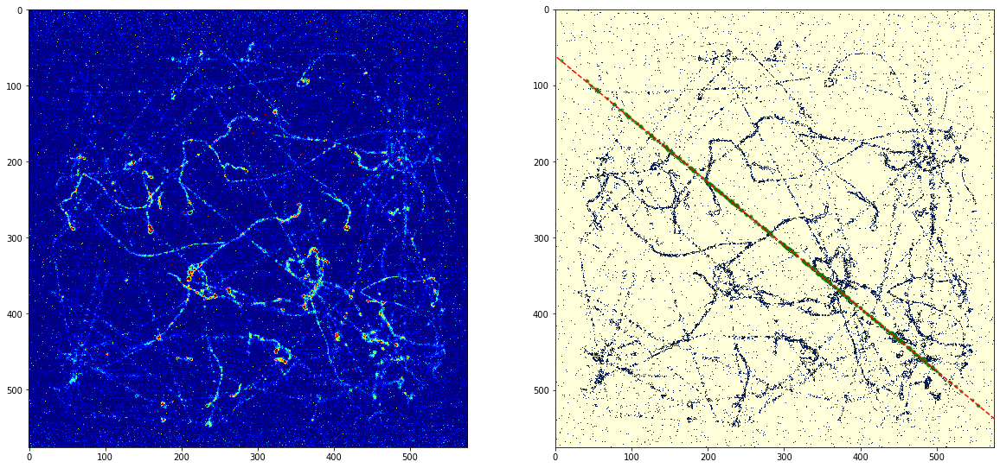

(array([305.91611269, 275.42696353]), array([-0.06097858,  0.99813907]))
(array([361.86743516, 143.95100865]), array([ 0.99777409, -0.0666848 ]))
ph 1626, dim: 347
x,y start: 668, 48, x,y stop: 524, 2180, length: 2137: 
Mean squared error: 0.34
Coefficient of determination: 0.99


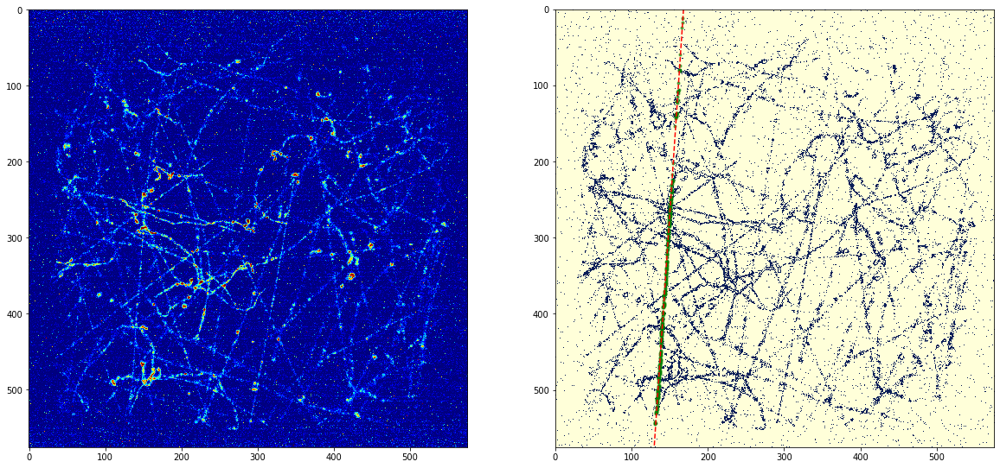

(array([320.1025022 , 292.20297352]), array([-0.06676783,  0.99776854]))
(array([391.76095618, 395.01195219]), array([ 0.88330337, -0.46880182]))
ph 1170, dim: 251
x,y start: 2196, 412, x,y stop: 1192, 2300, length: 2138: 
Mean squared error: 0.44
Coefficient of determination: 1.00


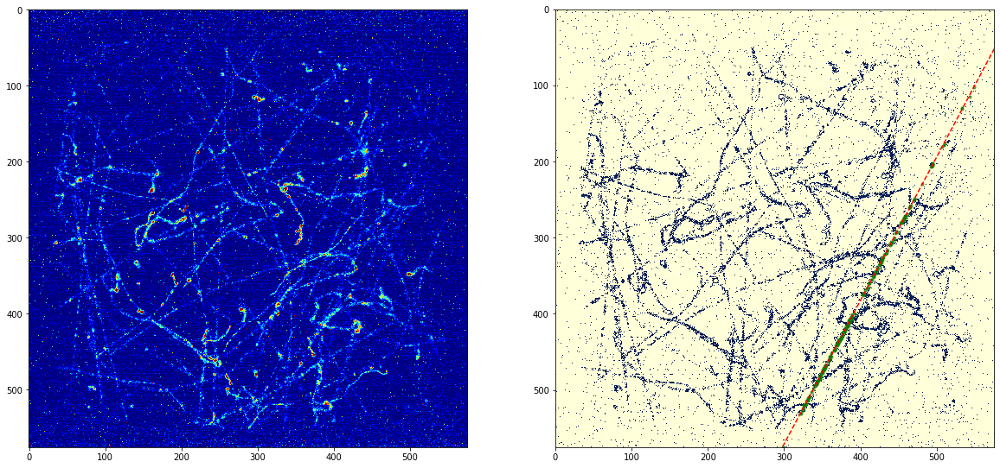

(array([290.19696669, 281.65748203]), array([0.51322001, 0.85825709]))
(array([365.02205882, 296.76102941]), array([0.99983981, 0.01789821]))
ph 1322, dim: 272
x,y start: 1160, 76, x,y stop: 1204, 2196, length: 2120: 
Mean squared error: 0.28
Coefficient of determination: 0.95


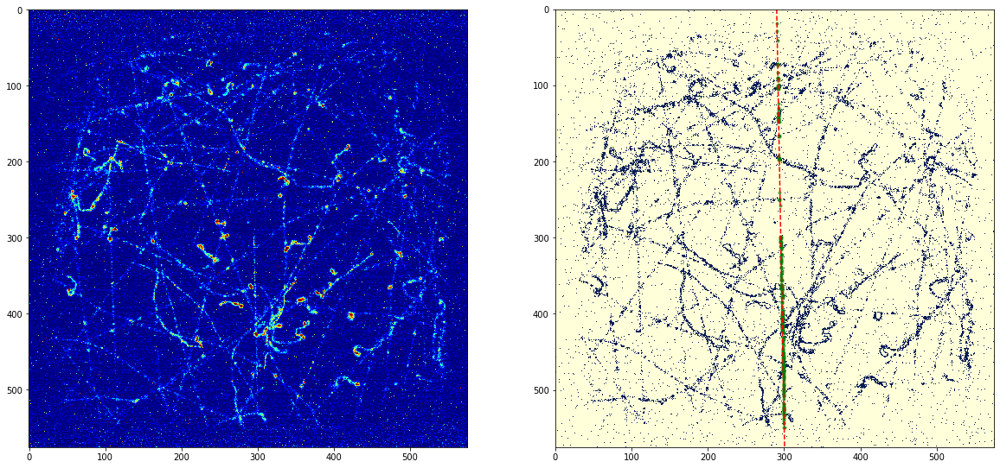

(array([308.98086762, 286.80395619]), array([ 0.99959375, -0.02850152]))
(array([340.0875576 , 332.54147465]), array([0.89480724, 0.4464527 ]))
ph 2084, dim: 434
x,y start: 716, 136, x,y stop: 1756, 2216, length: 2326: 
Mean squared error: 0.46
Coefficient of determination: 1.00


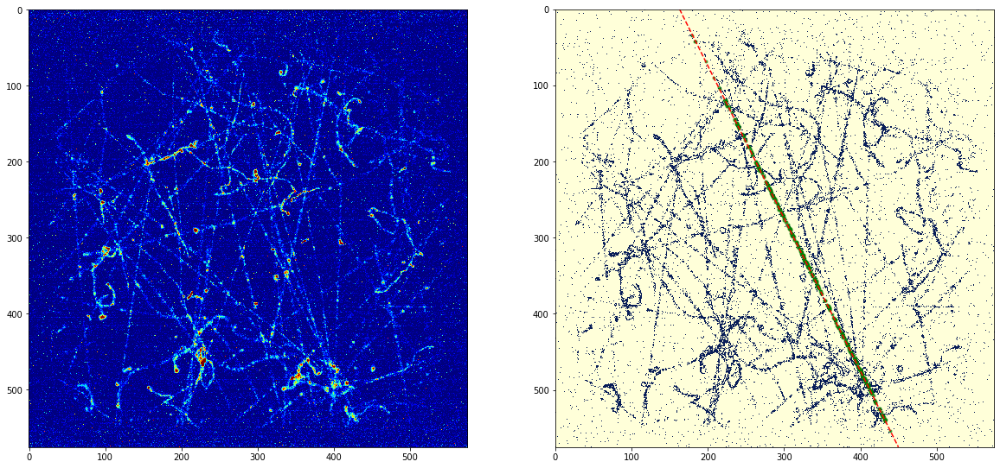

(array([317.73319504, 296.81705433]), array([-0.60802342,  0.79391909]))
(array([301.61728395, 434.83333333]), array([0.96922162, 0.24618985]))
ph 1536, dim: 324
x,y start: 1464, 124, x,y stop: 2016, 2292, length: 2237: 
Mean squared error: 0.31
Coefficient of determination: 1.00


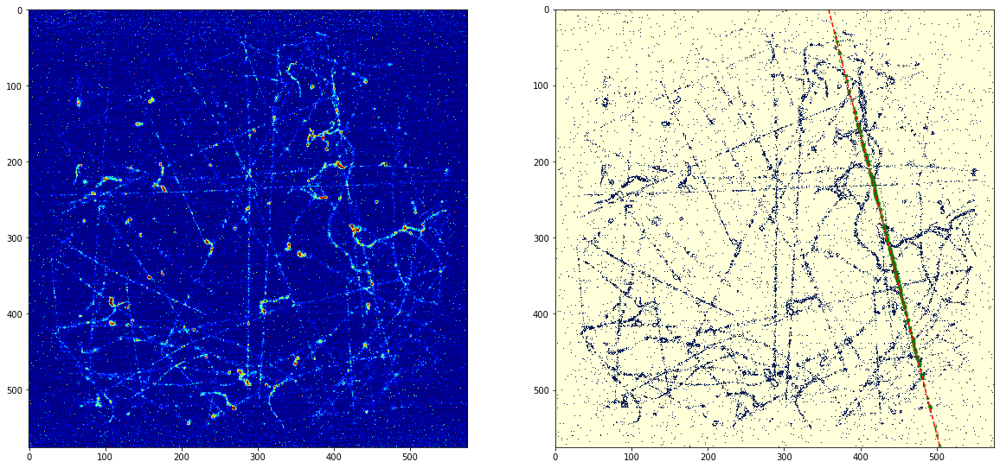

Processing RUN:  4035 Event:  20
(array([304.78741977, 275.98398588]), array([0.47267495, 0.88123685]))
(array([242.68508287, 326.32872928]), array([0.66082445, 0.7505405 ]))
ph 1743, dim: 362
x,y start: 276, 68, x,y stop: 2288, 1836, length: 2678: 
Mean squared error: 0.73
Coefficient of determination: 1.00


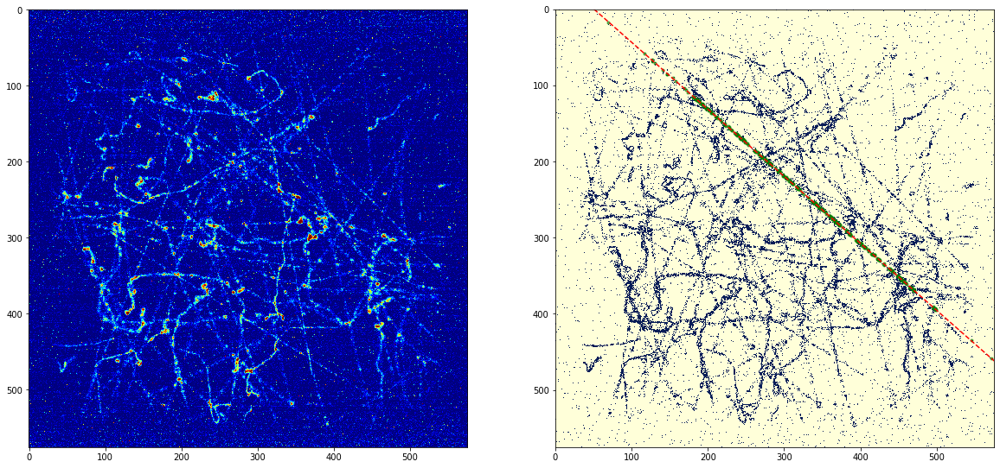

(array([295.67167879, 267.28579898]), array([ 0.72632443, -0.68735204]))
(array([314.05050505, 293.96717172]), array([ 0.75683008, -0.65361168]))
ph 1810, dim: 396
x,y start: 2252, 4, x,y stop: 292, 2276, length: 3001: 
Mean squared error: 0.51
Coefficient of determination: 1.00


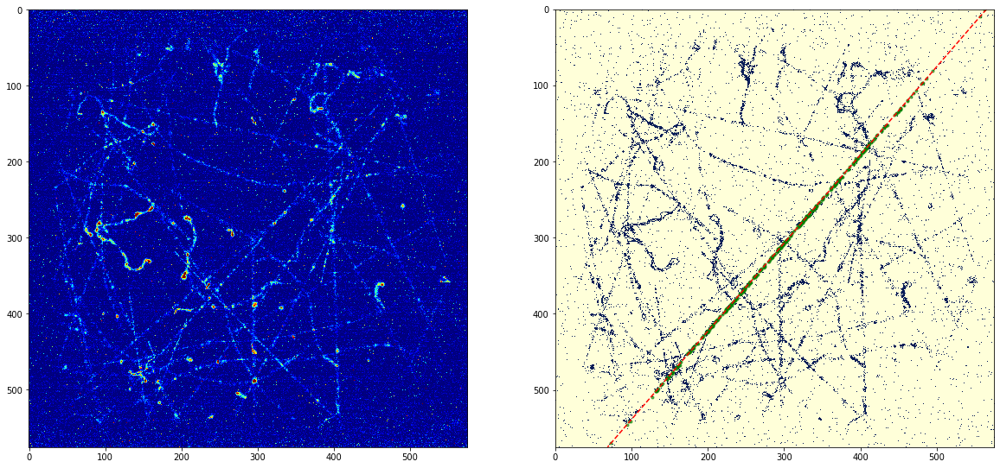

(array([297.98708932, 281.23368004]), array([-0.64771688,  0.76188112]))
(array([299.34351145, 209.38676845]), array([ 0.94550318, -0.32561287]))
ph 1883, dim: 393
x,y start: 1232, 48, x,y stop: 532, 2096, length: 2164: 
Mean squared error: 0.36
Coefficient of determination: 1.00


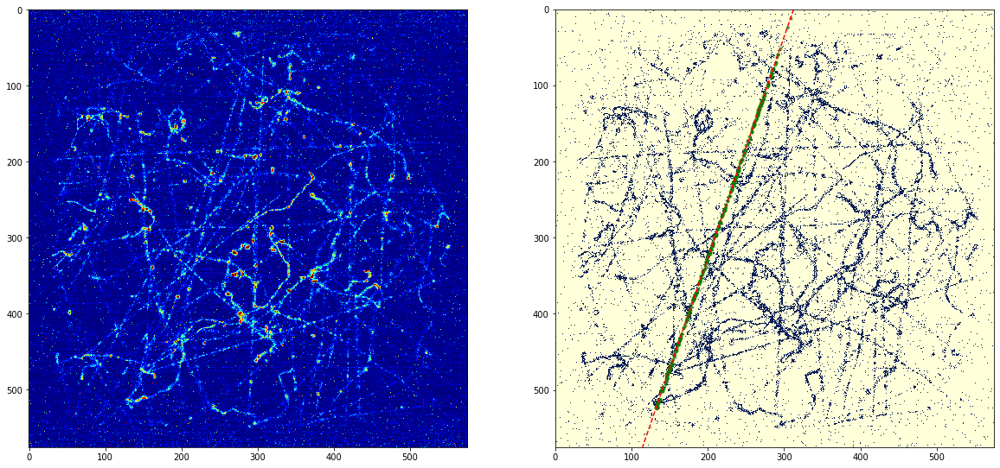

(array([300.60075983, 285.76146901]), array([0.22487874, 0.97438676]))
(array([198.1035503 , 332.78106509]), array([0.49824999, 0.86703342]))
ph 1490, dim: 338
x,y start: 160, 116, x,y stop: 2220, 1304, length: 2378: 
Mean squared error: 1.33
Coefficient of determination: 1.00


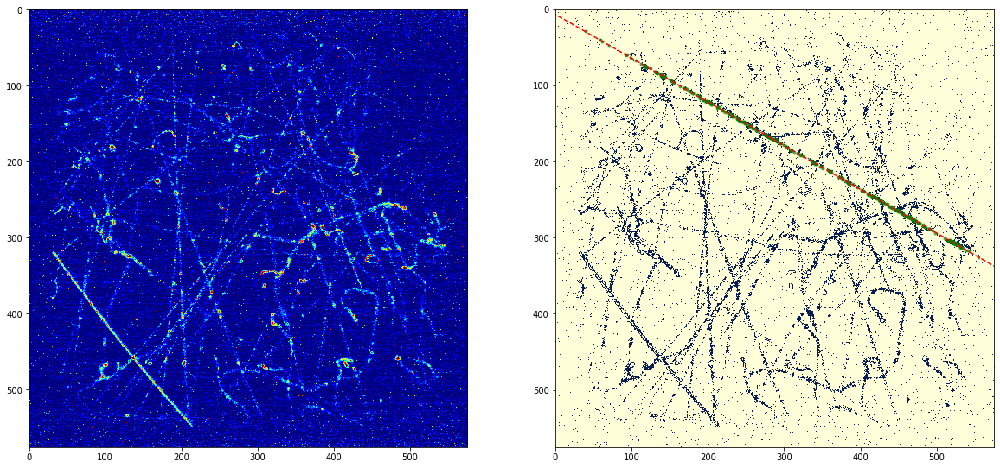

(array([294.08367448, 292.65252324]), array([-0.43659554,  0.8996579 ]))
(array([189.3837535, 327.3557423]), array([0.47194342, 0.88162884]))
ph 1665, dim: 357
x,y start: 24, 72, x,y stop: 2172, 1216, length: 2434: 
Mean squared error: 1.33
Coefficient of determination: 1.00


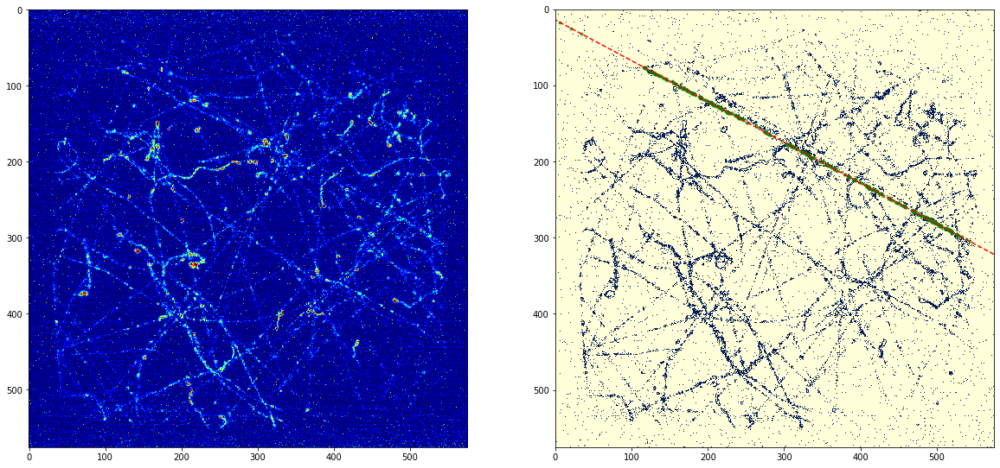

(array([306.02605718, 283.9017634 ]), array([ 0.97212899, -0.23444662]))
(array([303.395189  , 345.42955326]), array([ 0.9938713 , -0.11054336]))
ph 1441, dim: 291
x,y start: 1500, 144, x,y stop: 1260, 2284, length: 2153: 
Mean squared error: 0.39
Coefficient of determination: 1.00


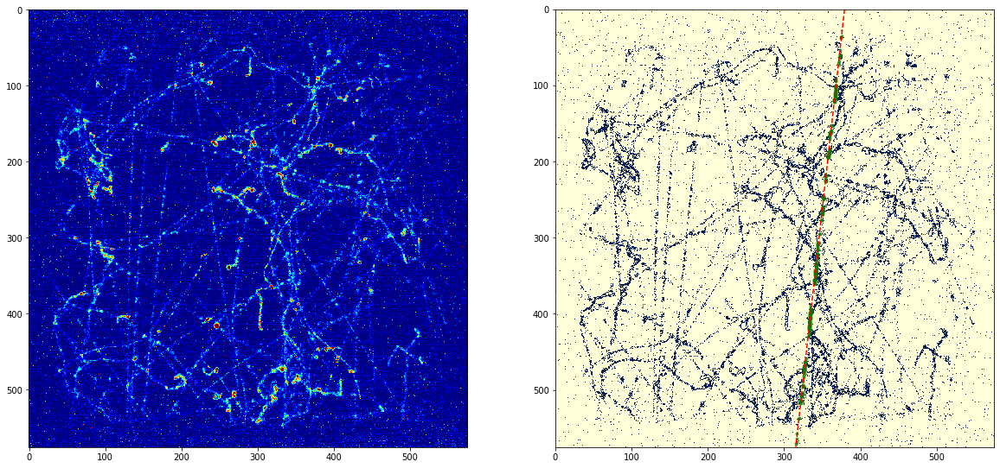

(array([308.22264473, 275.6682292 ]), array([-0.12673348,  0.9919368 ]))
(array([293.87078652, 278.22191011]), array([0.56489063, 0.82516579]))
ph 1703, dim: 356
x,y start: 72, 460, x,y stop: 2288, 1976, length: 2685: 
Mean squared error: 1.04
Coefficient of determination: 1.00


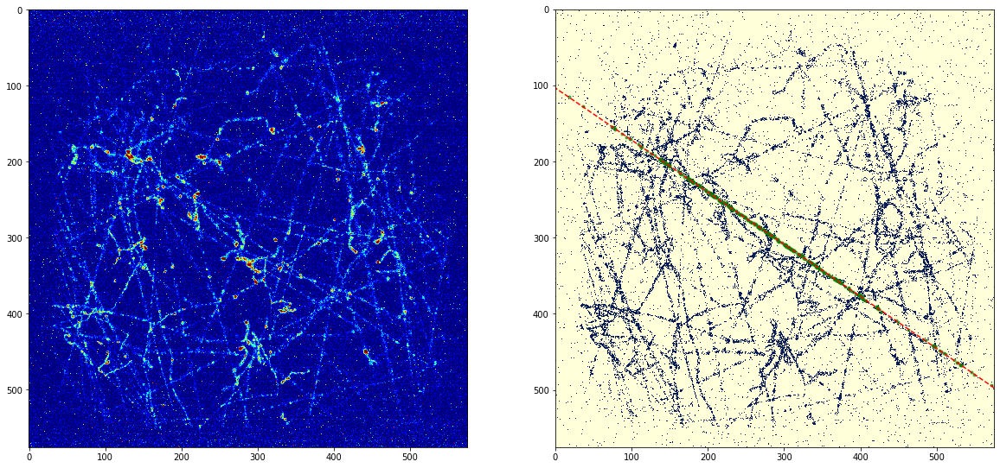

(array([312.66910847, 288.07620911]), array([ 0.9385393, -0.3451724]))
(array([406.36387435, 225.93455497]), array([ 0.6252052 , -0.78046041]))
ph 1848, dim: 382
x,y start: 2280, 520, x,y stop: 164, 2216, length: 2712: 
Mean squared error: 0.80
Coefficient of determination: 1.00


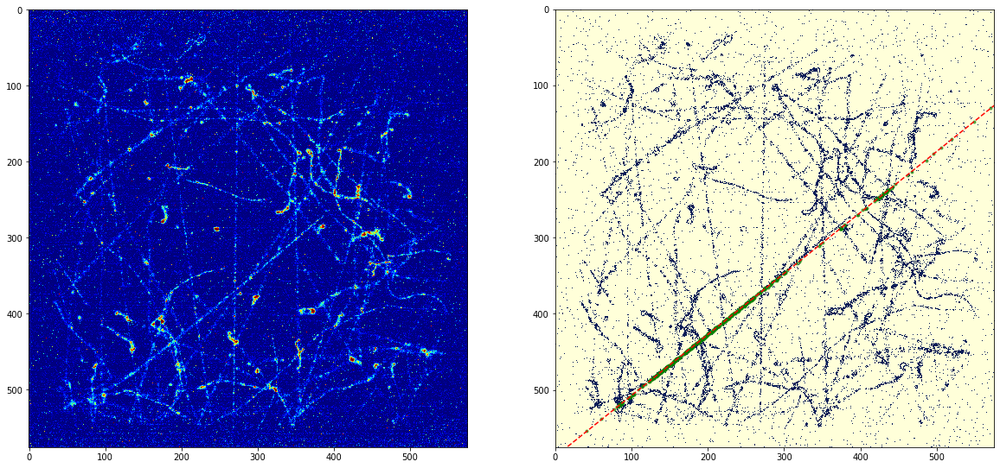

(array([313.18318954, 293.52110348]), array([0.28970549, 0.95711584]))
(array([293.64317181, 163.44933921]), array([ 0.99544909, -0.0952949 ]))
ph 985, dim: 227
x,y start: 748, 160, x,y stop: 572, 2072, length: 1920: 
Mean squared error: 0.31
Coefficient of determination: 1.00


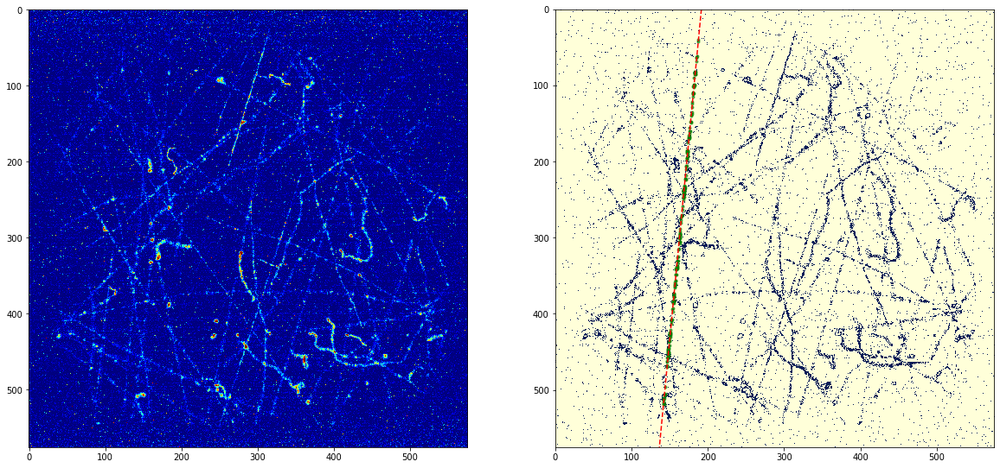

(array([307.35954754, 291.87303297]), array([0.50562636, 0.86275257]))
(array([306.68421053, 356.35167464]), array([0.73078232, 0.68261058]))
ph 1883, dim: 418
x,y start: 288, 12, x,y stop: 2148, 2004, length: 2725: 
Mean squared error: 0.59
Coefficient of determination: 1.00


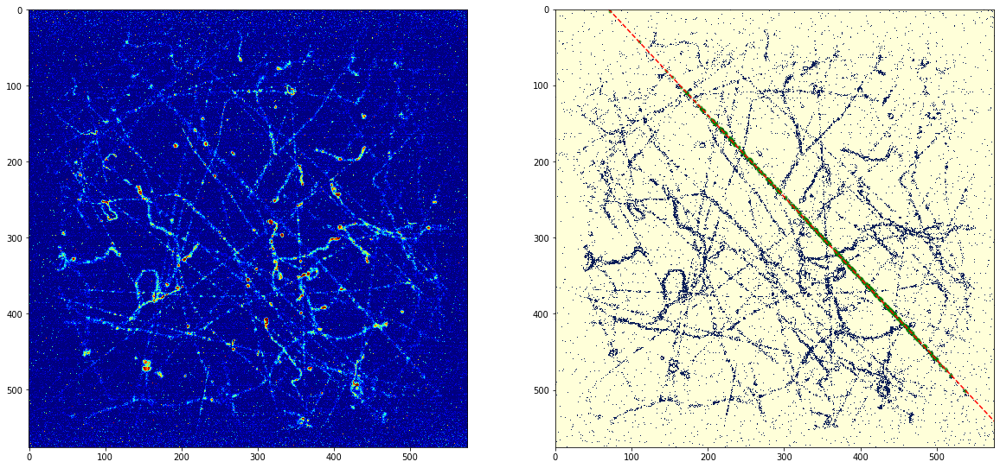

Processing RUN:  4035 Event:  30
(array([285.37856766, 303.1939152 ]), array([ 0.78625401, -0.61790341]))
(array([315.66426859, 305.33333333]), array([ 0.99643591, -0.08435332]))
ph 1951, dim: 417
x,y start: 1312, 156, x,y stop: 1132, 2296, length: 2148: 
Mean squared error: 0.33
Coefficient of determination: 1.00


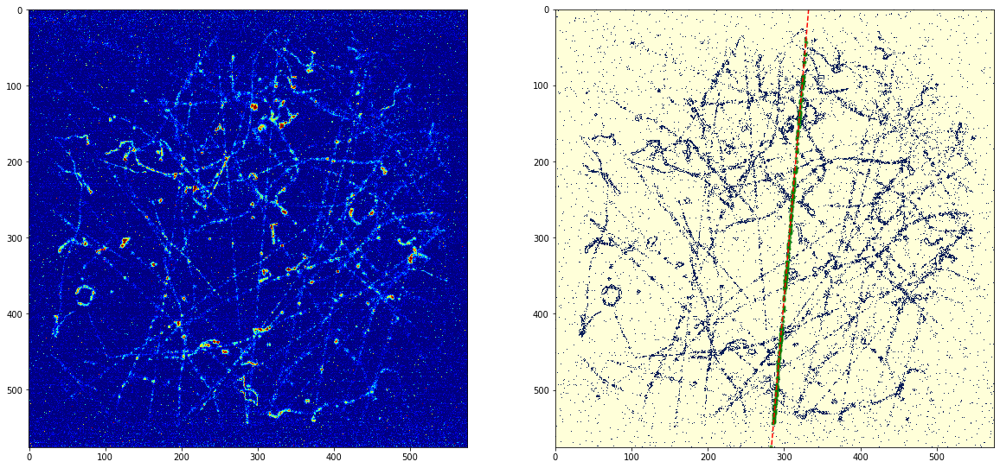

(array([283.98266373, 282.43239773]), array([0.91219164, 0.40976385]))
(array([271.36757991, 294.99315068]), array([0.40865625, 0.91268838]))
ph 2048, dim: 438
x,y start: 72, 588, x,y stop: 2256, 1572, length: 2395: 
Mean squared error: 1.90
Coefficient of determination: 1.00


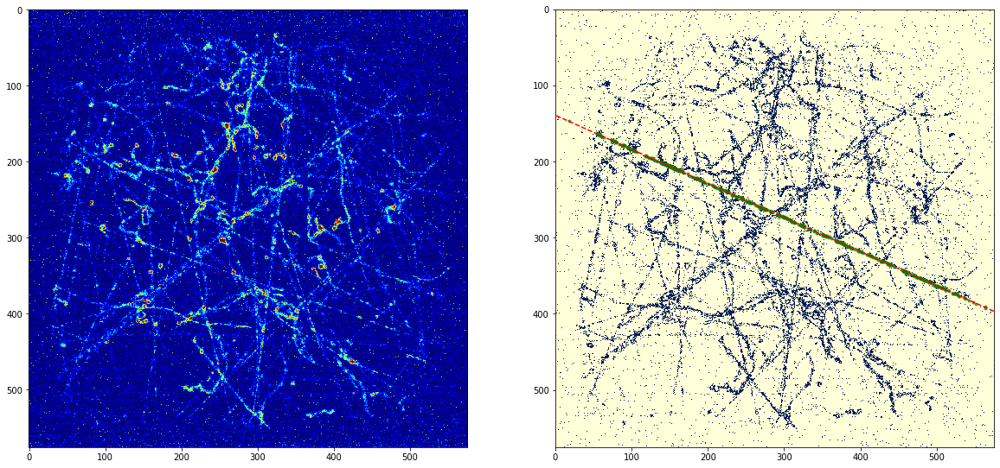

(array([310.96866108, 261.25339639]), array([ 0.7756387 , -0.63117716]))
(array([295.03012048, 332.22891566]), array([0.99069705, 0.13608581]))
ph 1546, dim: 332
x,y start: 1176, 92, x,y stop: 1472, 2200, length: 2129: 
Mean squared error: 0.30
Coefficient of determination: 1.00


In [ ]:
from skimage.measure import LineModelND, ransac, CircleModel
from skimage import io, feature, color, measure, draw, img_as_float
from sklearn.metrics import mean_squared_error, r2_score


#KFC cosmici
runI          = [4035]
run_ped       = 4034
cimax         = 10
cimin         = 0 
tag           = 'LAB'
nsigma        = 0.5

doRescale     = True
###############################################################
cfile = cy.open_(runI[0], tag=tag, posix=posix, verbose=False)
if cfile.x_resolution == 2048:
    rescale = 512 # orca flash
else:
    rescale = 576 # fusion


if not doRescale: 
    rescale = cfile.x_resolution
    
        
tscale = int(cfile.x_resolution/rescale)
print("rascale: ", tscale)

#########################

m_image, s_image = cy.ped_(run_ped, path=mybasepath+'ped/')

#########################

th_image   = np.round(m_image + nsigma*s_image)
print ("light over Th: %.2f " % (th_image.sum()-m_image.sum()))
    
for nRi in range(len(runI)):
    try:
        # open file
        cfile = cy.open_(runI[nRi], tag=tag, posix=posix, verbose=True)
    except:
        print ('Problem in open file: ', runI[nRi])
        break
    #
    for iTr in range(0, cfile.max_image): # max_image per tutte le imagini
        if iTr % 10 == 0: 
          # running & debug ...
          print ('Processing RUN: ', runI[nRi], 'Event: ', iTr)
          # end 

        image = rtnp.hist2array(cfile.file.Get(cfile.pic[iTr])).T
        raw_image       = np.subtract(image,m_image)
        rebin_image     = cy.rebin(raw_image, (rescale, rescale))  
        rebin_th_image  = cy.rebin((th_image-m_image), (rescale, rescale))
        edges           = (rebin_image > rebin_th_image) & (rebin_image < cimax)         
        points          = np.array(np.nonzero(edges)).T.astype(float)
        model = LineModelND()

        model.estimate(points)

        # robustly fit line only using inlier data with RANSAC algorithm
        model_robust, inliers = ransac(points, LineModelND, min_samples=2,
                                       residual_threshold=1, max_trials=1000)
        print(model.params)
        print(model_robust.params)
        outliers = inliers == False

        # generate coordinates of estimated models
        line_x = np.arange(0, rebin_image.shape[1])
        line_y = model.predict_y(line_x)
        line_y_robust = model_robust.predict_y(line_x)
        xc = points[inliers, 1]
        yc = points[inliers, 0]
        for j in range(0, xc.shape[0]):
            x=int(xc[j])
            y=int(yc[j])
            #ph += rebin_image[y,x]
            if j == 0:
                x0start = x*tscale
                y0start = y*tscale
        x0end = x*tscale
        y0end = y*tscale
        fig, ax = plt.subplots (1,2, figsize=(20,10))

        ax[0].imshow(rebin_image, cmap='jet', vmin=0, vmax=20)
        ax[1].imshow(edges, cmap='YlGnBu', vmin=0,vmax=1)
        ax[1].plot(xc, yc, '.g', alpha=0.6,
        label='Inlier data', markersize=6)
        ax[1].plot(line_y_robust, line_x, '--r', label='Robust line model')
        ax[1].set_xlim(0,rebin_image.shape[1]-1)
        ax[1].set_ylim(rebin_image.shape[0]-1,0)
        ph, dim = cy.cluster_par(xc, yc, rebin_image)
        print("ph {:.0f}, dim: {:d}".format( ph, dim))
        length = np.sqrt((x0end - x0start)**2 + (y0end - y0start)**2)
        print("x,y start: {:d}, {:d}, x,y stop: {:d}, {:d}, length: {:.0f}: ".format(
            x0start, y0start, x0end, y0end, length))
        print('Mean squared error: %.2f'
              % mean_squared_error(points[inliers][:,1], model_robust.predict_y(points[inliers][:,0])))
        # The coefficient of determination: 1 is perfect prediction
        print('Coefficient of determination: %.2f'
              % r2_score(points[inliers][:,1], model_robust.predict_y(points[inliers][:,0])))
        plt.show()
